In [1]:
include("../ntl.jl")
import Random

using LinearAlgebra
Random.seed!(1)

MersenneTwister(1)

In [2]:
using DataFrames
using CSV
using TextAnalysis

joes_tweets_complete = DataFrame(CSV.File("../data/JoeBidenTweets.csv"))
joes_tweets_complete = joes_tweets_complete[end-99:end, ["timestamp", "tweet"]]
joes_tweets = joes_tweets_complete[:, "tweet"]
joes_tweets = [StringDocument(tweet) for tweet in joes_tweets]

for tweet in joes_tweets
    remove_corrupt_utf8!(tweet)
    remove_case!(tweet)
    prepare!(tweet, strip_articles| strip_indefinite_articles| strip_definite_articles)
    prepare!(tweet, strip_prepositions| strip_pronouns| strip_stopwords| strip_numbers| strip_non_letters)
    prepare!(tweet, strip_html_tags| strip_frequent_terms| strip_sparse_terms)
    stem!(tweet)
end

joes_tweets = [ngrams(tweet) for tweet in joes_tweets]
joes_tweets = [filter(e->!startswith(e.first, "https"), tweet) for tweet in joes_tweets]
joes_tweets = vcat(DataFrame.(joes_tweets)..., cols = :union)
joes_tweets = coalesce.(joes_tweets, 0)
joes_tweets = Matrix(joes_tweets)
joes_tweets = Matrix(transpose(joes_tweets))

588×100 Matrix{Int64}:
 1  0  0  0  0  0  0  0  0  0  0  0  0  …  0  0  0  0  0  0  0  0  0  0  0  0
 1  0  0  0  1  0  1  0  0  0  0  0  0     0  0  0  0  0  1  0  0  0  0  0  1
 2  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 1  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 1  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 1  0  0  0  0  0  0  0  0  0  0  0  0  …  0  0  0  0  0  0  0  0  0  0  0  0
 1  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 1  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 1  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 1  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 1  0  0  0  0  0  0  0  0  0  0  0  0  …  0  0  0  0  0  0  0  0  0  0  0  0
 1  0  0  0  0  0  0  0  1  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 1  0  0  0  0  0  0  0  0  0  0  0  0   

In [3]:
geometric_arrivals = Ntl.Models.GeometricArrivals(
    prior=[1., 1.],
    sample_parameter_posterior=true
)
ntl_cluster_parameters = Ntl.Models.NtlParameters(
    [1., 1.],
    geometric_arrivals,
    sample_parameter_posterior=false
)
multinomial_parameters = Ntl.Models.MultinomialParameters(1, (1/10)ones(Int64, size(joes_tweets)[1]))
multinomial_mixture_model = Ntl.Models.Mixture(ntl_cluster_parameters, multinomial_parameters)
metropolis_hastings_sampler = Ntl.Samplers.MetropolisHastingsSampler(
    num_iterations=80000, 
    num_burn_in=0, 
    proposal_radius=5,                                                  
    skip=1, 
    adaptive=false,
    assignment_types=["random", "all same cluster", "all different clusters"]
)
multinomial_output = Ntl.Fitter.fit(
    joes_tweets, 
    multinomial_mixture_model, 
    metropolis_hastings_sampler
) 

Progress: 100%|█████████████████████████████████████████| Time: 0:14:18
Progress: 100%|█████████████████████████████████████████| Time: 0:16:14
Progress: 100%|█████████████████████████████████████████| Time: 0:20:53


Dict{String, Array} with 3 entries:
  "assignments"       => [1 1 … 1 1; 1 2 … 2 2; … ; 47 47 … 99 99; 100 100 … 99…
  "arrival posterior" => [0.120653 0.0105768 0.997579; 0.166683 0.0858678 0.979…
  "log likelihood"    => [-7367.86 -7628.72 -6921.48; -7219.57 -7273.44 -6919.4…

In [18]:
Ntl.Plot.plot_log_likelihoods(
    multinomial_output["log likelihood"],
    assignment_types=metropolis_hastings_sampler.assignment_types,
    legend_location=:bottomright
)

In [28]:
Ntl.Plot.plot_num_clusters(
    multinomial_output["assignments"],
    assignment_types=metropolis_hastings_sampler.assignment_types
)

In [31]:
Ntl.Plot.plot_trace(
    multinomial_output["arrival posterior"],
    assignment_types=metropolis_hastings_sampler.assignment_types,
    ylabel="Interarrivals parameter posterior"
)

Progress: 100%|█████████████████████████████████████████| Time: 0:00:28


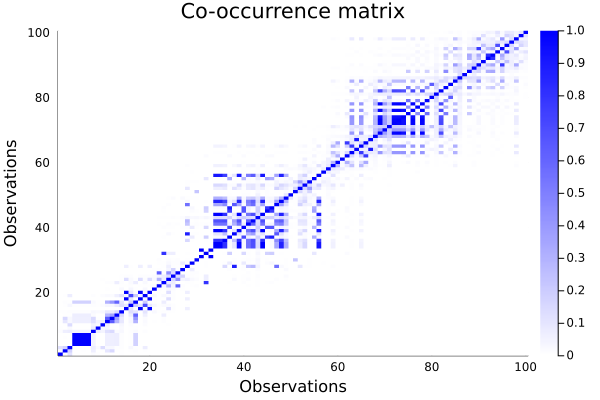

In [7]:
Ntl.Plot.plot_co_occurrence_matrix(
    multinomial_output["assignments"][:, :, 1], 
    num_burn_in=40000
)

Progress: 100%|█████████████████████████████████████████| Time: 0:00:25


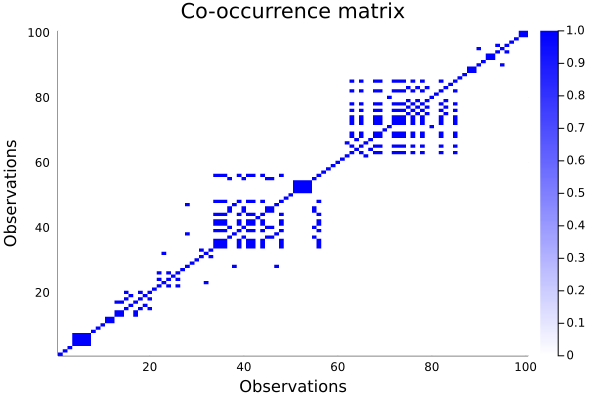

In [21]:
multinomial_vi_estimate = Ntl.Utils.minVI(
    multinomial_output["assignments"][:, :, 1], 
    num_burn_in=40000
)
Ntl.Plot.plot_co_occurrence_matrix(multinomial_vi_estimate)

In [9]:
joes_tweets_complete[:, "cluster"] = multinomial_vi_estimate 
CSV.write("JoeBidenTweetsClusteringMultinomial.csv", joes_tweets_complete)

"JoeBidenTweetsClusteringMultinomial.csv"

In [10]:
dp_cluster_parameters = Ntl.Models.DpParameters(
    1.,
    sample_parameter_posterior=true
)
multinomial_parameters = Ntl.Models.MultinomialParameters(1, (1/10)ones(Int64, size(joes_tweets)[1]))
dp_multinomial_mixture_model = Ntl.Models.Mixture(dp_cluster_parameters, multinomial_parameters)
gibbs_sampler = Ntl.Samplers.GibbsSampler(
    num_iterations=10000, 
    num_burn_in=0, 
    assignment_types=["random", "all same cluster", "all different clusters"]
)
dp_multinomial_output = Ntl.Fitter.fit(
    joes_tweets, 
    dp_multinomial_mixture_model, 
    gibbs_sampler
) 

Progress: 100%|█████████████████████████████████████████| Time: 0:23:38
Progress: 100%|█████████████████████████████████████████| Time: 0:19:46
Progress: 100%|█████████████████████████████████████████| Time: 0:21:38


Dict{String, Array} with 3 entries:
  "assignments"       => [1 1 … 1 1; 2 2 … 2 2; … ; 17 99 … 99 99; 52 100 … 100…
  "cluster parameter" => [2.53013 1.0 1.0; 2.46299 1.26374 1.8922; … ; 16.3711 …
  "log likelihood"    => [-7458.86 -7628.72 -7280.62; -6936.87 -6927.53 -6946.3…

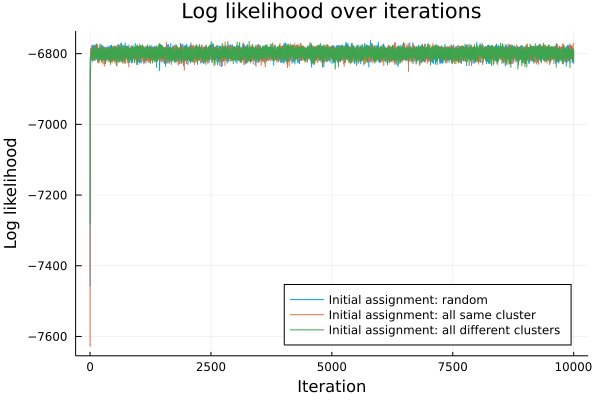

In [11]:
Ntl.Plot.plot_log_likelihoods(
    dp_multinomial_output["log likelihood"],
    assignment_types=gibbs_sampler.assignment_types,
    legend_location=:bottomright
)

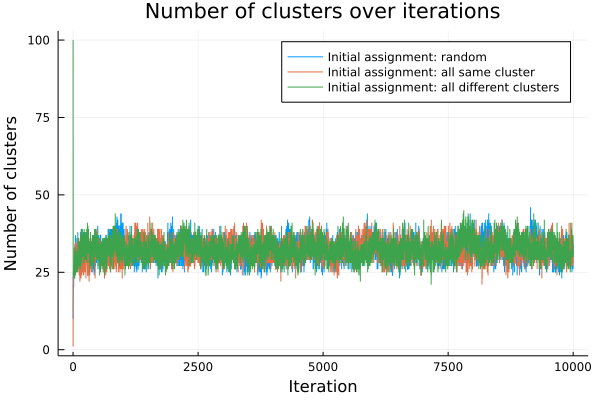

In [29]:
Ntl.Plot.plot_num_clusters(
    dp_multinomial_output["assignments"],
    assignment_types=gibbs_sampler.assignment_types
)

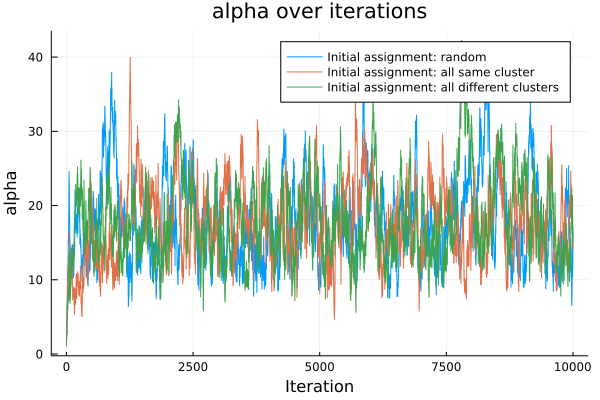

In [33]:
Ntl.Plot.plot_trace(
    dp_multinomial_output["cluster parameter"],
    assignment_types=gibbs_sampler.assignment_types,
    ylabel="alpha"
)

Progress: 100%|█████████████████████████████████████████| Time: 0:00:03


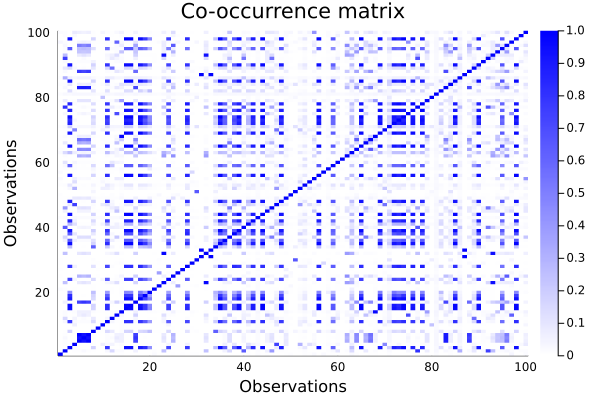

In [14]:
Ntl.Plot.plot_co_occurrence_matrix(
    dp_multinomial_output["assignments"][:, :, 1], 
    num_burn_in=5000
)

Progress: 100%|█████████████████████████████████████████| Time: 0:00:03


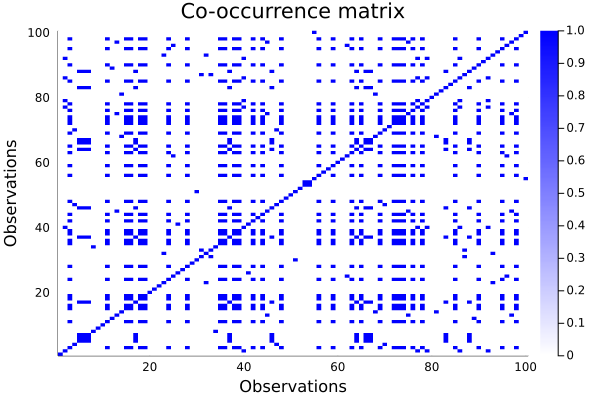

In [15]:
dp_multinomial_vi_estimate = Ntl.Utils.minVI(
    dp_multinomial_output["assignments"][:, :, 1], 
    num_burn_in=5000
)
Ntl.Plot.plot_co_occurrence_matrix(dp_multinomial_vi_estimate)

In [23]:
joes_tweets_complete[:, "cluster"] = dp_multinomial_vi_estimate 
CSV.write("JoeBidenTweetsClusteringDpMultinomial.csv", joes_tweets_complete)

"JoeBidenTweetsClusteringDpMultinomial.csv"

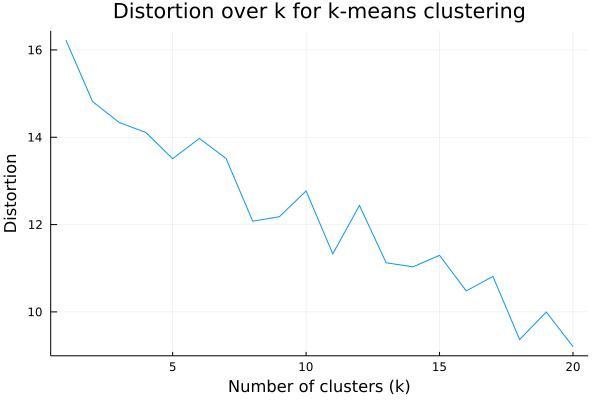

In [3]:
normalized_joes_tweets = mapslices(x -> x./sum(x), joes_tweets; dims=1)
Ntl.Plot.plot_kmeans_elbow(normalized_joes_tweets, max_num_clusters=20)

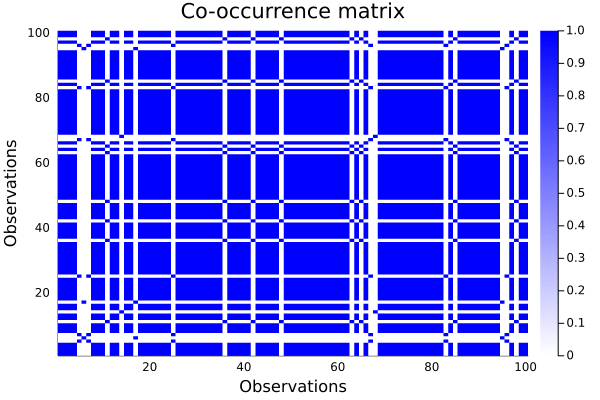

In [6]:
using Clustering
kmeans_num_clusters = 5
final_kmeans_result = kmeans(normalized_joes_tweets, kmeans_num_clusters)
kmeans_clustering = final_kmeans_result.assignments
Ntl.Plot.plot_co_occurrence_matrix(kmeans_clustering)

In [7]:
joes_tweets_complete[:, "cluster"] = kmeans_clustering
CSV.write("JoeBidenTweetsClusteringMultinomialKmeans.csv", joes_tweets_complete)

"JoeBidenTweetsClusteringMultinomialKmeans.csv"